# Dataset Preprocessing

### Library loading

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
from matplotlib import pylab

import yaml
import os
warnings.filterwarnings('ignore')


In [2]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')
pylab.rcParams['figure.figsize'] = (9, 9)


scanpy==1.8.1 anndata==0.7.6 umap==0.4.6 numpy==1.20.2 scipy==1.6.3 pandas==1.2.4 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


In [3]:
OXPHOG = ["MT-ND1","MT-ND2","MT-ND3","MT-ND4","MT-ND4","MT-ND5","MT-ND6","MT-CYB","MT-CO1","MT-CO2","MT-CO3","MT-ATP6","MT-ATP8","MT-RNR2"]

### Configure paths

In [4]:
hostRoot = "-".join(socket.gethostname().split('-')[0:2])



#indir=paths["paths"]["indir"][hostRoot]
outdir="./outdir"
dataDir = "./data"
colorMapPath = "./colorMap.yaml"
with open(colorMapPath, 'r') as f:
    colorMap = yaml.load(f, Loader=yaml.FullLoader)["uns_colors"]



In [5]:

control3_piece2 = sc.read_10x_h5(dataDir+"/control3_piece2/count/sample_feature_bc_matrix.h5")
control1_piece1 = sc.read_10x_h5(dataDir+"/control1_piece1/count/sample_feature_bc_matrix.h5")
control2_piece2 = sc.read_10x_h5(dataDir+"/control2_piece2/count/sample_feature_bc_matrix.h5")
control3_piece1 = sc.read_10x_h5(dataDir+"/control3_piece1/count/sample_feature_bc_matrix.h5")
control1_piece3 = sc.read_10x_h5(dataDir+"/control1_piece3/count/sample_feature_bc_matrix.h5")
control1_piece2 = sc.read_10x_h5(dataDir+"/control1_piece2/count/sample_feature_bc_matrix.h5")
control2_piece3= sc.read_10x_h5(dataDir+"/control2_piece3/count/sample_feature_bc_matrix.h5")
control3_piece3= sc.read_10x_h5(dataDir+"/control3_piece3/count/sample_feature_bc_matrix.h5")
control2_piece1 = sc.read_10x_h5(dataDir+"/control2_piece1/count/sample_feature_bc_matrix.h5")



polaroid2_medial = sc.read_10x_h5(dataDir+"/polaroid2_medial/count/sample_feature_bc_matrix.h5")
polaroid3_medial = sc.read_10x_h5(dataDir+"/polaroid3_medial/count/sample_feature_bc_matrix.h5")
polaroid3_distal = sc.read_10x_h5(dataDir+"/polaroid3_distal/count/sample_feature_bc_matrix.h5")
polaroid1_distal = sc.read_10x_h5(dataDir+"/polaroid1_distal/count/sample_feature_bc_matrix.h5")
polaroid2_distal = sc.read_10x_h5(dataDir+"/polaroid2_distal/count/sample_feature_bc_matrix.h5")
polaroid1_medial = sc.read_10x_h5(dataDir+"/polaroid1_medial/count/sample_feature_bc_matrix.h5")
polaroid1_proximal= sc.read_10x_h5(dataDir+"/polaroid1_proximal/count/sample_feature_bc_matrix.h5")
polaroid2_proximal= sc.read_10x_h5(dataDir+"/polaroid2_proximal/count/sample_feature_bc_matrix.h5")
polaroid3_proximal = sc.read_10x_h5(dataDir+"/polaroid3_proximal/count/sample_feature_bc_matrix.h5")


reading ./data/control3_piece2/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control1_piece1/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control2_piece2/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control3_piece1/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control1_piece3/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control1_piece2/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control2_piece3/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control3_piece3/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/control2_piece1/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid2_medial/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid3_medial/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid3_distal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid1_distal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid2_distal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid1_medial/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid1_proximal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid2_proximal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


reading ./data/polaroid3_proximal/count/sample_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [6]:
adDict = {"control3_piece2":control3_piece2,"control1_piece1":control1_piece1,"control2_piece2":control2_piece2,"control3_piece1":control3_piece1,"control1_piece3":control1_piece3,"control1_piece2":control1_piece2,"control2_piece3":control2_piece3,"control3_piece3":control3_piece3,"control2_piece1":control2_piece1,"polaroid3_medial":polaroid3_medial,"polaroid2_medial":polaroid2_medial,"polaroid3_distal":polaroid3_distal,"polaroid1_distal":polaroid1_distal,"polaroid2_distal":polaroid2_distal,"polaroid1_medial":polaroid1_medial,"polaroid1_proximal":polaroid1_proximal,"polaroid2_proximal":polaroid2_proximal,"polaroid3_proximal":polaroid3_proximal}

In [7]:
for adata in list(adDict.keys()):
    adDict[adata]
    adDict[adata].obs["dataset"] = adata
    adDict[adata].obs["organoid"] = adata.split("_")[0]
    adDict[adata].obs["region"] = adata.split("_")[1]
    adDict[adata].obs_names = adDict[adata].obs_names + "_" +adata
    adDict[adata].var_names_make_unique()
    


In [8]:

adata = ad.concat(list(adDict.values()), join="outer")
adata.obs["type"] = adata.obs["organoid"].str[:-1]
adata.obs["type"].value_counts()
adata.obs["type_region"] = adata.obs["type"].astype("str") + "_" +adata.obs["region"].astype("str")

# mapping colors

In [9]:
adata.obs["regionContrast"] = adata.obs["region"]
adata.obs["regionContrast"] = adata.obs["regionContrast"].replace({"piece2":"control","piece1":"control","piece3":"control"}).astype("category")
adata.obs["dataset"] = adata.obs["dataset"].astype("category")
adata.obs["organoid"] = adata.obs["organoid"].astype("category")
adata.obs["region"] = adata.obs["region"].astype("category")
adata.obs["type"] = adata.obs["type"].astype("category")
adata.obs["type_region"] = adata.obs["type_region"].astype("category")

with open(colorMapPath, 'r') as f:
    colorMap = yaml.load(f, Loader=yaml.FullLoader)["uns_colors"]
colorMap

adata.uns["regionContrast_colors"] = [colorMap[i]["color"] for i in adata.obs["regionContrast"].cat.categories]
adata.uns["region_colors"] = [colorMap[i]["color"] for i in adata.obs["region"].cat.categories]
adata.uns["type_colors"] = [colorMap[i]["color"] for i in adata.obs["type"].cat.categories]
#adata.uns["regionContrast_colors"] = [colorMap[i]["color"] for i in adata.obs["regionContrast"].cat.categories]


## QCs

normalizing counts per cell
    finished (0:00:00)


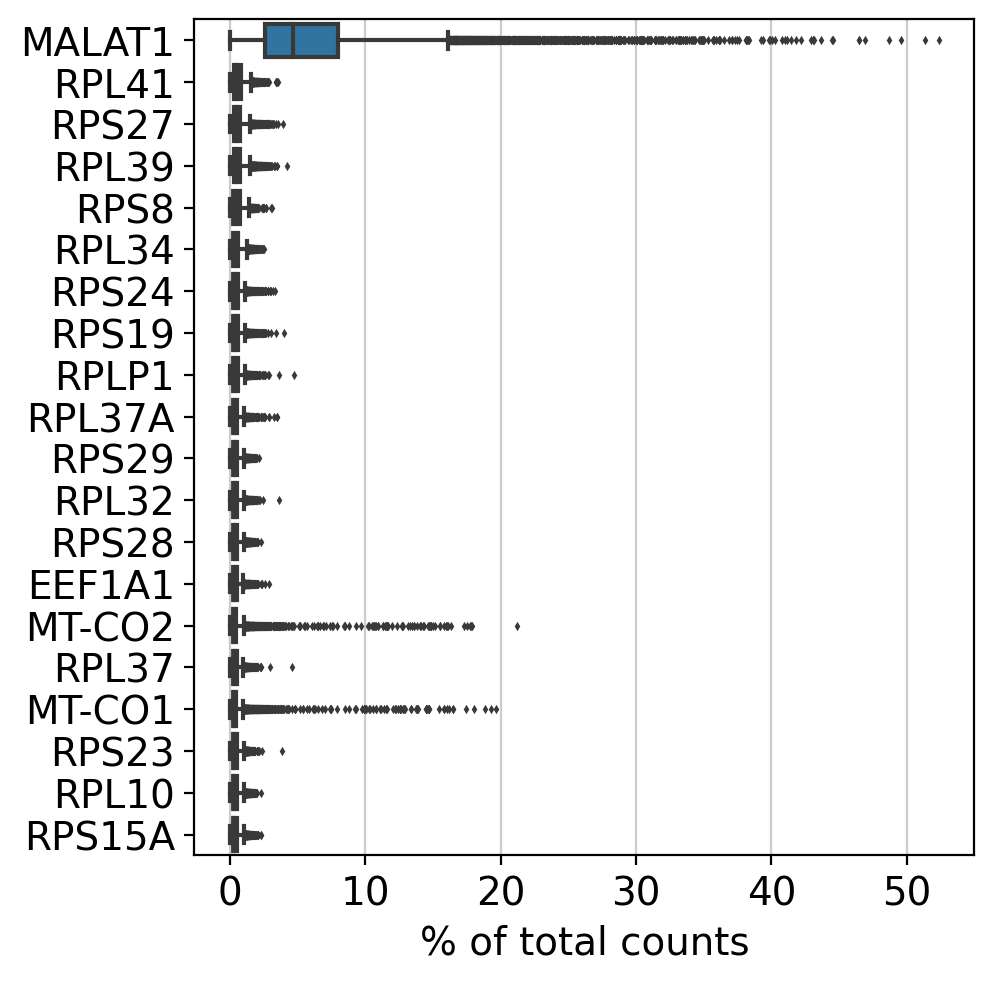

In [10]:
sc.pl.highest_expr_genes(adata, n_top=20, )

In [11]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['ribo'] = adata.var_names.str.startswith('RP')  # annotate the group of ribosomal genes as 'ribo'

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['ribo'], percent_top=None, log1p=True, inplace=True)

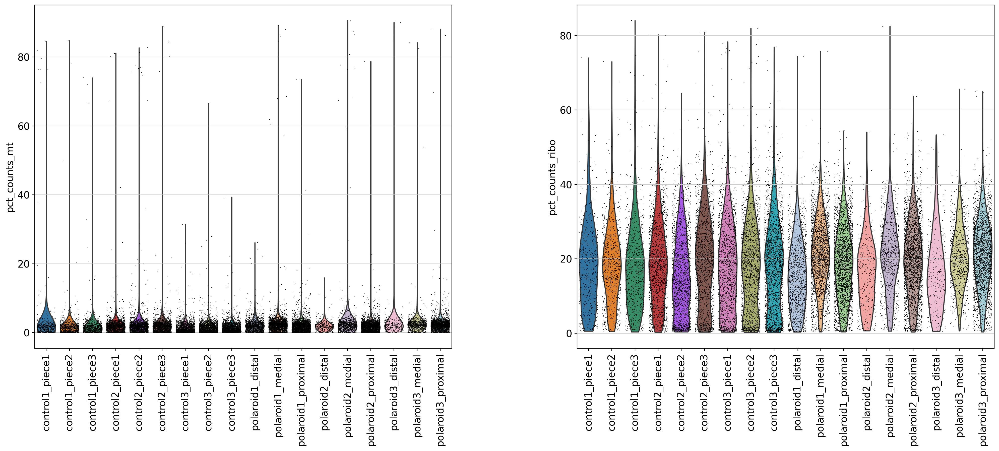

In [12]:
sc.pl.violin(adata, ['pct_counts_mt','pct_counts_ribo'],
             groupby= "dataset", jitter=0.4, multi_panel=True, rotation=90)

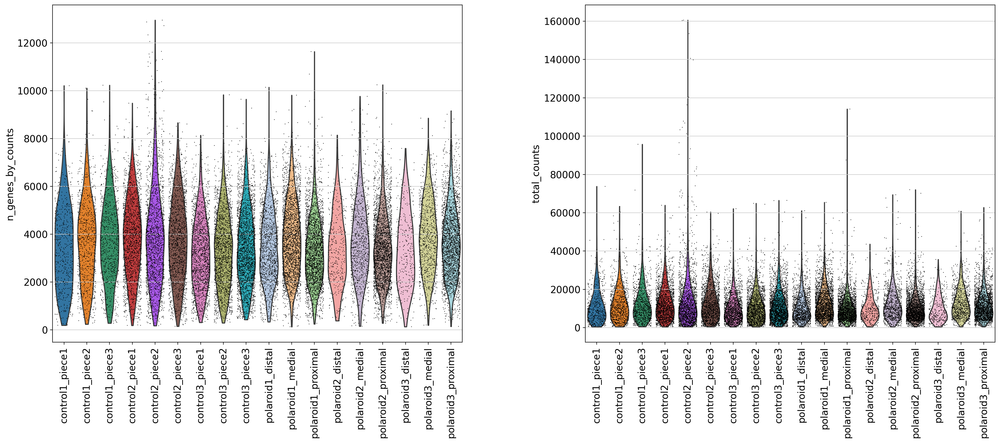

In [13]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             groupby= "dataset", jitter=0.4, multi_panel=True, rotation=90)

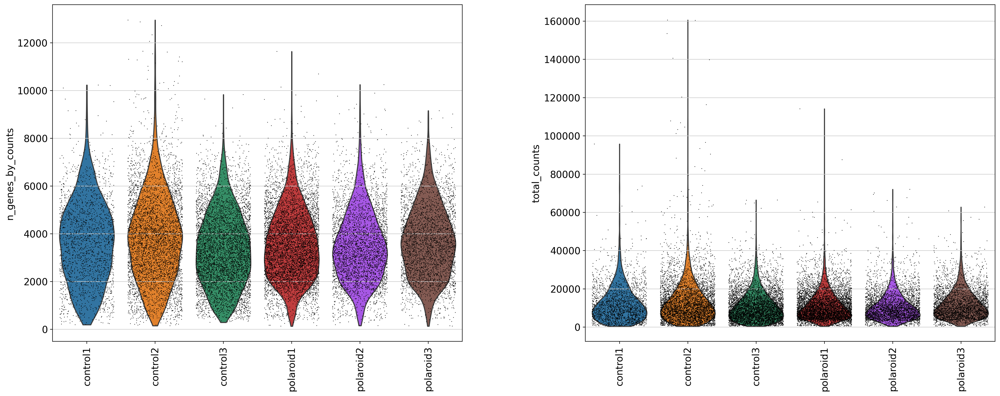

In [14]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             groupby= "organoid", jitter=0.4, multi_panel=True, rotation=90)

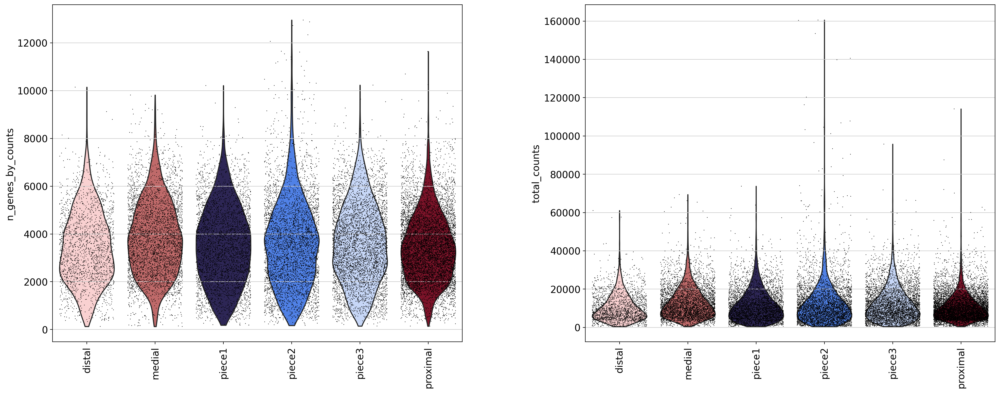

In [15]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             groupby= "region", jitter=0.4, multi_panel=True, rotation=90)

In [16]:
adata.write_h5ad(outdir+"/1_polaroid_mint.h5ad")
